## BHARAT INTERN

## Dogs & Cats Image Classification (TASK1)





##Dowloading Dataset

In [53]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [54]:
!kaggle datasets download -d salader/dogs-vs-cats


dogs-vs-cats.zip: Skipping, found more recently modified local copy (use --force to force download)


## Unzip the Dataset

In [55]:
!unzip dogs-vs-cats.zip

Archive:  dogs-vs-cats.zip
replace dogs_vs_cats/test/cats/cat.10.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

## Import Modules

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## Create Dataframe for Input and Output

In [88]:
input_path = []
label = []

for class_name in os.listdir("train"):
    for path in os.listdir("train/"+class_name):
        if class_name == 'cats':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("train", class_name, path))
print(input_path[0], label[0])

train/dogs/dog.9914.jpg 1


In [98]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()



,images,label
0,train/dogs/dog.1662.jpg,1
1,train/dogs/dog.11225.jpg,1
2,train/cats/cat.12055.jpg,0
3,train/dogs/dog.1387.jpg,1
4,train/dogs/dog.2286.jpg,1


In [59]:
for i in df['images']:
    if '.jpg' not in i:
        print(i)

In [60]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

[]

In [61]:

df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

20000

## Exploratory Data Analysis

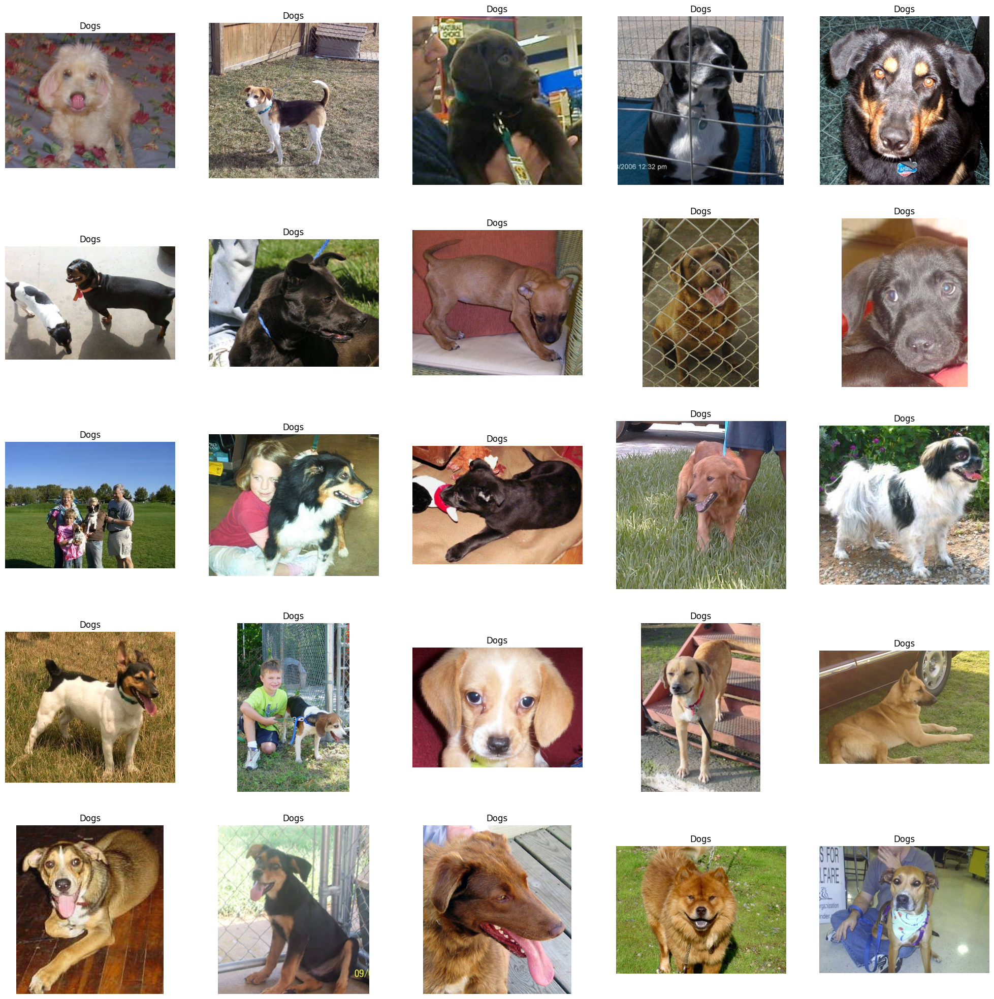

In [95]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')


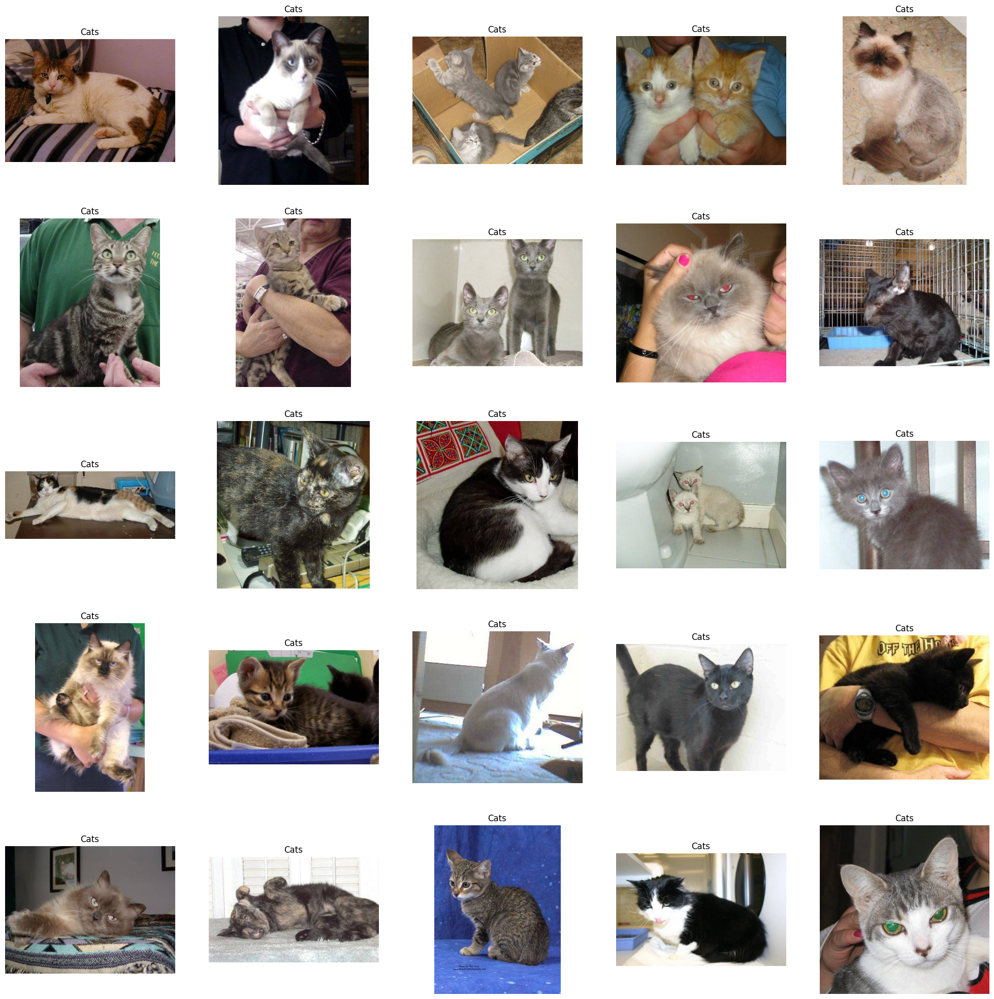

In [96]:

plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

## Create DataGenerator for the Images

In [73]:
df['label'] = df['label'].astype('str')

In [74]:
df.head()

,images,label
0,train/dogs/dog.495.jpg,1
1,train/cats/cat.3584.jpg,0
2,train/dogs/dog.6711.jpg,1
3,train/dogs/dog.3029.jpg,1
4,train/cats/cat.3700.jpg,0


In [75]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [76]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 40,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 16000 validated image filenames belonging to 2 classes.
Found 4000 validated image filenames belonging to 2 classes.


## Model Creation

In [77]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
                    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPool2D((2,2)),
                    Conv2D(32, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Flatten(),
                    Dense(512, activation='relu'),
                    Dense(1, activation='sigmoid')
])

In [78]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 63, 63, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 14, 14, 64)       

In [79]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
32/32 [==============================] - 98s 3s/step - loss: 0.7304 - accuracy: 0.5352 - val_loss: 0.6421 - val_accuracy: 0.6440
Epoch 2/10
32/32 [==============================] - 94s 3s/step - loss: 0.6303 - accuracy: 0.6414 - val_loss: 0.5901 - val_accuracy: 0.6890
Epoch 3/10
32/32 [==============================] - 92s 3s/step - loss: 0.6014 - accuracy: 0.6687 - val_loss: 0.6011 - val_accuracy: 0.6710
Epoch 4/10
32/32 [==============================] - 93s 3s/step - loss: 0.5814 - accuracy: 0.6929 - val_loss: 0.5645 - val_accuracy: 0.7110
Epoch 5/10
32/32 [==============================] - 92s 3s/step - loss: 0.5516 - accuracy: 0.7156 - val_loss: 0.5210 - val_accuracy: 0.7412
Epoch 6/10
32/32 [==============================] - 92s 3s/step - loss: 0.5380 - accuracy: 0.7243 - val_loss: 0.5095 - val_accuracy: 0.7525
Epoch 7/10
32/32 [==============================] - 93s 3s/step - loss: 0.5192 - accuracy: 0.7409 - val_loss: 0.5010 - val_accuracy: 0.7502
Epoch 8/10
32/32 [==

## Visualization of Results

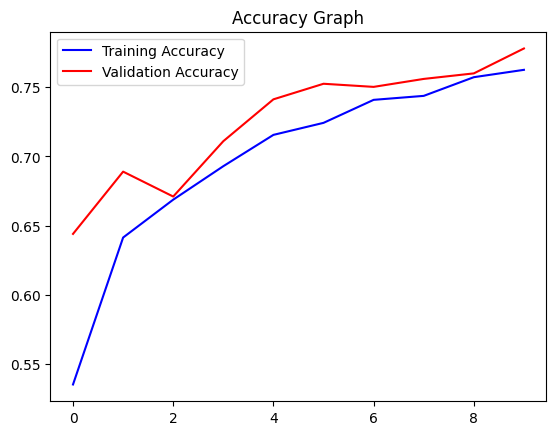

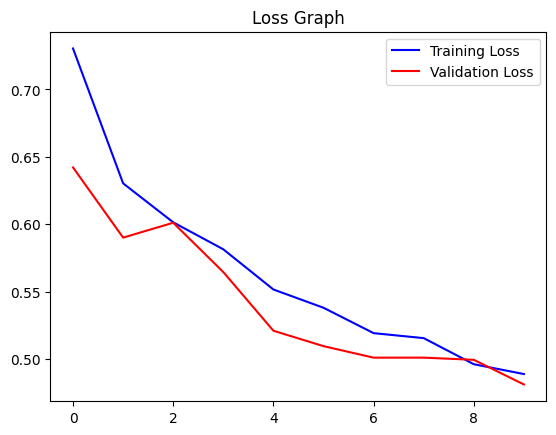

In [82]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

## Test with Real Image

In [105]:
image_path = "/content/dog-breeds-that-act-like-cats-afghan-hound.webp"
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0
img = img.reshape(1, 128, 128, 3)
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 [==============================] - 0s 28ms/step
Dog
